# USING GRADCAMS TO LEARN DEEP LEARNING

On this notebook I will implement gradcam algorithm to learn and to assert concepts about CNNs. Since the idea is to toy around a bit with grad cams I am not going to work deeply in CNNs architecture so there might be way better approaches for this problem.

In [2]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

# Display
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm


We are loading a pretrained model to compare results between more complex models and the ones we could develop in a fast manner.


In [3]:
model_builder = keras.applications.xception.Xception
img_size = (299, 299)
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions

last_conv_layer_name = "block14_sepconv2_act"

# The local path to our target image
img_path = keras.utils.get_file(
    "african_elephant.jpg", "https://i.imgur.com/Bvro0YD.png"
)

# display(Image(img_path))


4218880/4217496 [==============================] - 0s 0us/step


In [4]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


In [5]:
# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Make model
model = model_builder(weights="imagenet")

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=1)[0])

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
# plt.matshow(heatmap)
# plt.show()


40960/35363 [==================================] - 0s 0us/step
Predicted: [('n02504458', 'African_elephant', 9.862387)]


# Grad Cam algorithm

In [6]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


# save_and_display_gradcam(img_path, heatmap)


In [7]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')), tf.config.experimental.list_physical_devices('GPU')), tf.config.list_physical_devices('GPU'), tf.test.gpu_device_name()

Num GPUs Available:  1 [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


(None,
 [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')],
 '/device:GPU:0')

In [8]:
!nvidia-smi | grep "Tesla"

|   0  Tesla P4            Off  | 00000000:00:04.0 Off |                    0 |


# Let us build some model to check their differences.

We will use for this a very recurrent problem to test cnns and that also is very visual. This will help us to understand better what the output of the gradcams are.

In [9]:
#Importing the packages
# import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import numpy as np
import matplotlib.pyplot as plt

#Loading the data
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'
#Unzipping the contents
path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)
PATH = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

68608000/68606236 [==============================] - 0s 0us/step


In [11]:
train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'validation')
#Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')
#Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')
#Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
#Directory with our validation dog pictures 
validation_dogs_dir = os.path.join(validation_dir, 'dogs')
validation_cats_dir, validation_dogs_dir, train_dir

num_cats_tr = len(os.listdir(train_cats_dir))
num_dogs_tr = len(os.listdir(train_dogs_dir))
num_cats_val = len(os.listdir(validation_cats_dir))
num_dogs_val = len(os.listdir(validation_dogs_dir))
total_train = num_cats_tr + num_dogs_tr
total_val = num_cats_val + num_dogs_val
print('total training cat images:', num_cats_tr)
print('total training dog images:', num_dogs_tr)
print('total validation cat images:', num_cats_val)
print('total validation dog images:', num_dogs_val)
print("--")
print("Total training images:", total_train)
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


In [60]:
batch_size = 10
epochs = 15
IMG_HEIGHT = 150
IMG_WIDTH = 150

# Generator for our training data
train_image_generator = ImageDataGenerator(rescale=1./255, rotation_range=20, vertical_flip=True)
# Generator for our validation data
validation_image_generator = ImageDataGenerator(rescale=1./255)


train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size, directory=train_dir, 
                                                           shuffle=True, target_size=(IMG_HEIGHT, IMG_WIDTH), class_mode='binary')

val_data_gen = validation_image_generator.flow_from_directory(batch_size=batch_size,directory=validation_dir,target_size=(IMG_HEIGHT, IMG_WIDTH),class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


To better understand how an imagedatagenerator works let us use to display 6 random samples



In [61]:
sample_training_images, _ = next(train_data_gen)
sample_val_images, _ = next(val_data_gen)

# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr, n_img = 10):
    ancho = n_img/10
    fig, axes = plt.subplots(2, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()
# plotImages(sample_training_images)


There are 2 common approaches in CNNs architecture. Begining with narrow layers in term of neurons and advance into more wide layers and viceversa. 

Also, the idea of using a max pooling layer after blocks of conv layers is observed to deliver good results.

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 150, 150, 128)     3584      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 75, 75, 128)       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 75, 75, 64)        73792     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 37, 37, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 37, 37, 32)        18464     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 18, 18, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 18, 18, 16)        4

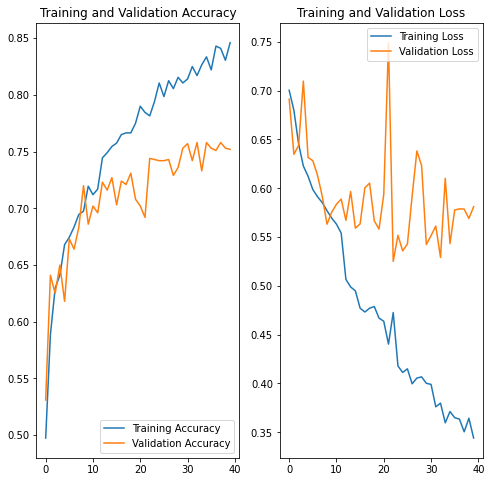

In [15]:
model_new = Sequential([Conv2D(128, 3, padding='same', activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH ,3)),
                        MaxPooling2D(),
                        Conv2D(64, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Conv2D(32, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Conv2D(16, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Dropout(0.2),
                        Flatten(),
                        Dense(64, activation='relu'),
                        Dense(1, activation = 'sigmoid')])

from keras.callbacks import EarlyStopping, ReduceLROnPlateau

# To prevent over fitting we will stop the learning after 10 epochs and val_loss value not decreased
earlystop = EarlyStopping(patience=10)



# We will reduce the learning rate when then accuracy not increase for 2 steps

learning_rate_reduction = ReduceLROnPlateau(monitor='accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

callbacks = [learning_rate_reduction]


rms = tf.keras.optimizers.RMSprop(lr=0.00075)
model_new.compile(optimizer=rms, loss='binary_crossentropy',metrics=['accuracy'])
model_new.summary()
batch_size = 10
epochs = 40





history = model_new.fit(train_data_gen, steps_per_epoch=int(total_train/batch_size), 
                                epochs=epochs, validation_data=val_data_gen, validation_steps=int(total_val/batch_size), callbacks=callbacks)






acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']
epochs_range = range(epochs)
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_26 (Conv2D)           (None, 150, 150, 32)      896       
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 150, 150, 32)      9248      
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 75, 75, 32)        0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 75, 75, 32)        0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 75, 75, 64)        18496     
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 75, 75, 64)        36928     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 37, 37, 64)       

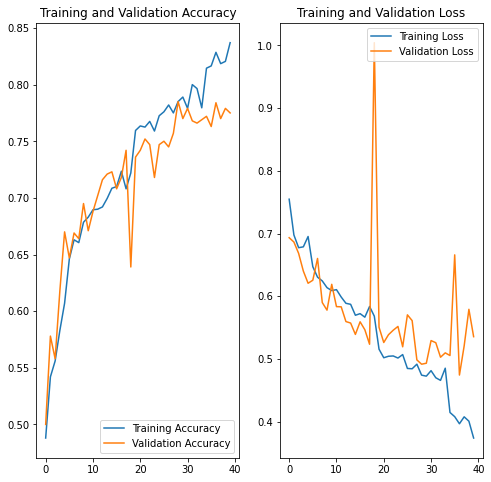

In [65]:
model_new2 = Sequential([Conv2D(32, 3, padding='same', activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH ,3)),
                        Conv2D(32, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Dropout(0.15),
                        Conv2D(64, 3, padding='same', activation='relu'),
                        Conv2D(64, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Dropout(0.15),
                        Conv2D(128, 3, padding='same', activation='relu'),
                        Conv2D(128, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Dropout(0.25),
                        Flatten(),
                        Dense(128, activation='relu'),
                        Dropout(0.5),
                        Dense(32, activation='relu'),
                        Dense(1, activation = 'sigmoid')])

from keras.callbacks import EarlyStopping, ReduceLROnPlateau

# To prevent over fitting we will stop the learning after 10 epochs and val_loss value not decreased
earlystop = EarlyStopping(patience=10)



# We will reduce the learning rate when then accuracy not increase for 2 steps

learning_rate_reduction = ReduceLROnPlateau(monitor='accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

callbacks = [learning_rate_reduction]


rms = tf.keras.optimizers.RMSprop(lr=0.00075)
model_new2.compile(optimizer=rms, loss='binary_crossentropy',metrics=['accuracy'])
model_new2.summary()
batch_size = 10
epochs = 40





history = model_new2.fit(train_data_gen, steps_per_epoch=int(total_train/batch_size), 
                                epochs=epochs, validation_data=val_data_gen, validation_steps=int(total_val/batch_size), callbacks=callbacks)






acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']
epochs_range = range(epochs)
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [54]:
# tf.keras.utils.plot_model(
#     model,
#     to_file="model.png",
#     show_shapes=True,
#     show_dtype=True,
#     show_layer_names=True,
#     rankdir="TB",
#     expand_nested=False,
#     dpi=96)

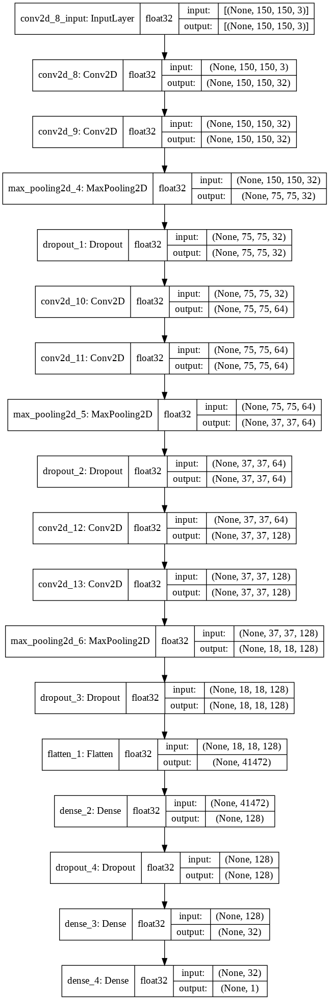

In [17]:
tf.keras.utils.plot_model(
    model_new2,
    to_file="model.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96)


Let us adapt the Keras code for gradcams for our problem. To get the names of the convs layer we want we will iterate the layers and retrieve their names. This can be achieved in a more programmatic way.

In [18]:
def save_and_display_gradcam_own_model(img, heatmap, cam_path="cam.jpg", alpha=0.4):
    heatmap = np.uint8(255 * heatmap)
    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)
    superimposed_img.save(cam_path)
    return plt.imshow(cv2.imread(cam_path))
# save_and_display_gradcam_own_model(img, heatmap)

In [56]:
# for layer in model_new.layers:
#   print(layer.name)

In [71]:
# for layer in model_new2.layers:
#   print(layer.name)

## GRAD CAMS 1. DIFFERENCES BETWEEN MODELS

Let us evaluate the differences between what last layers of both models are learning. Just because the numbers of filters are different the size of the heatmaps will be different. We have seen that both models perform in a similar way in terms of metrics, maybe the second one is slightly better. We see that heatmaps for model 1 are larger because it goes in reverse to other model in terms of neurons by layer

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 Model1 says this is a  --> Cat, Model 2 says ---> Cat and it is actually a ---> Dog


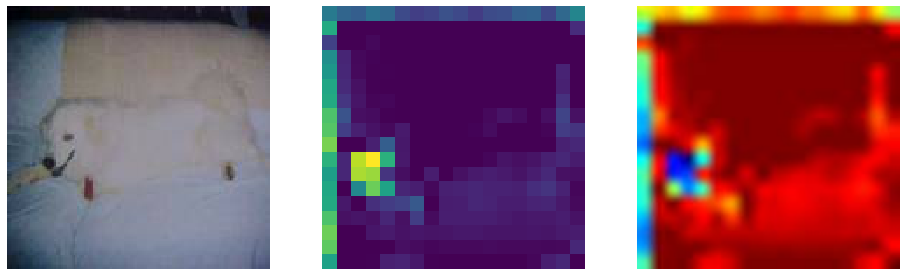

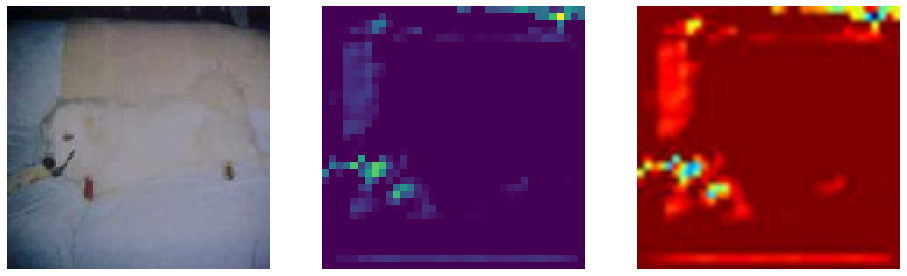

 
 Model1 says this is a  --> Cat, Model 2 says ---> Cat and it is actually a ---> Dog


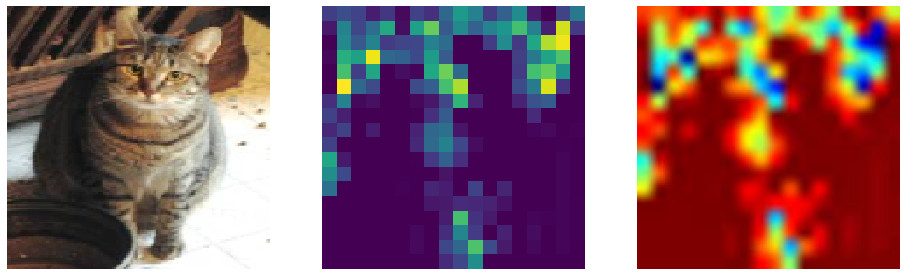

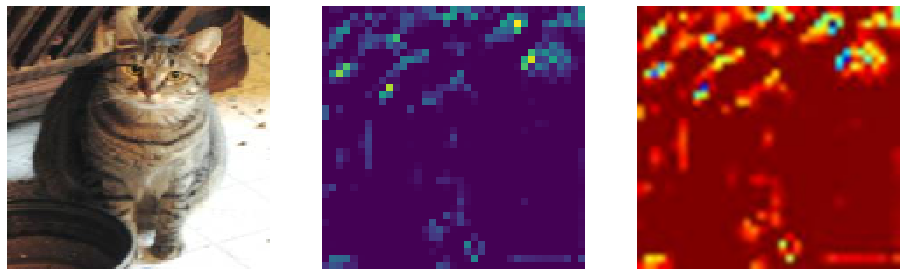

 
 Model1 says this is a  --> Dog, Model 2 says ---> Dog and it is actually a ---> Cat


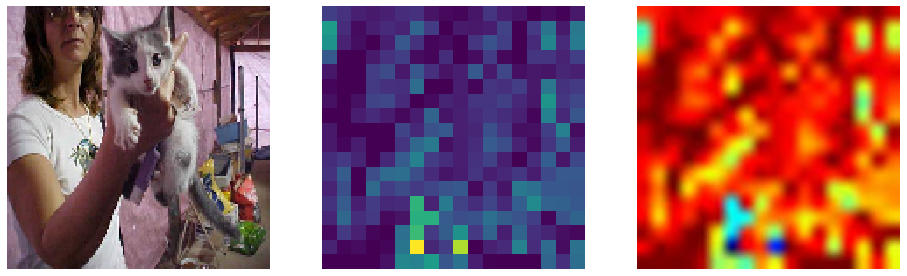

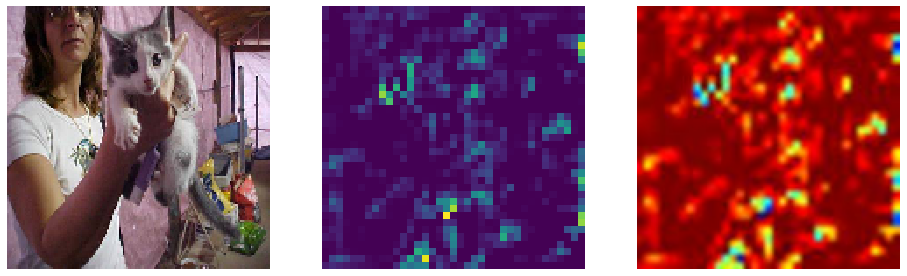

 
 Model1 says this is a  --> Dog, Model 2 says ---> Dog and it is actually a ---> Cat


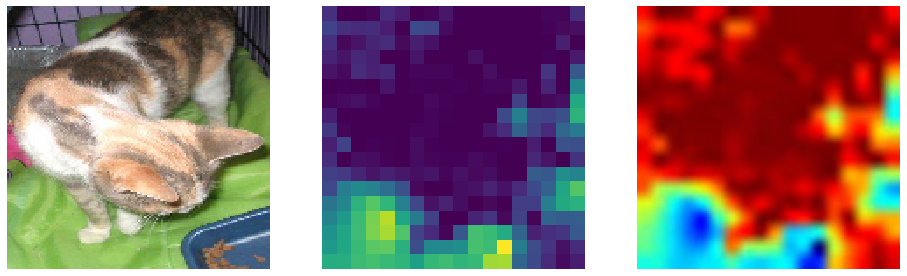

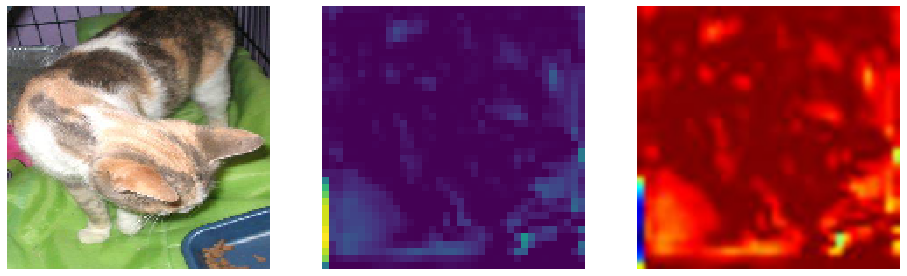

 
 Model1 says this is a  --> Cat, Model 2 says ---> Cat and it is actually a ---> Dog


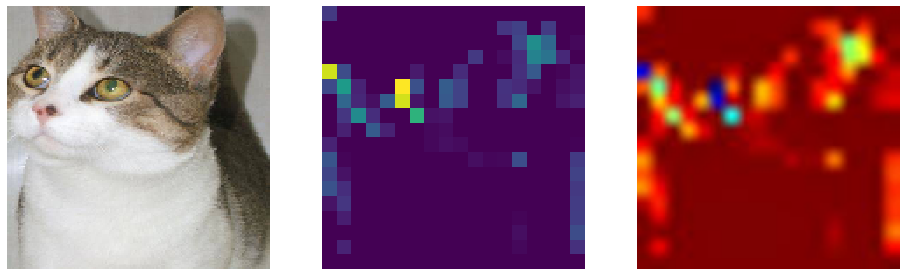

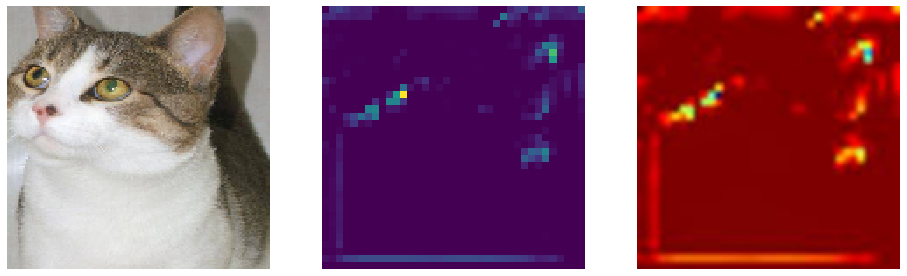

 
 Model1 says this is a  --> Dog, Model 2 says ---> Dog and it is actually a ---> Cat


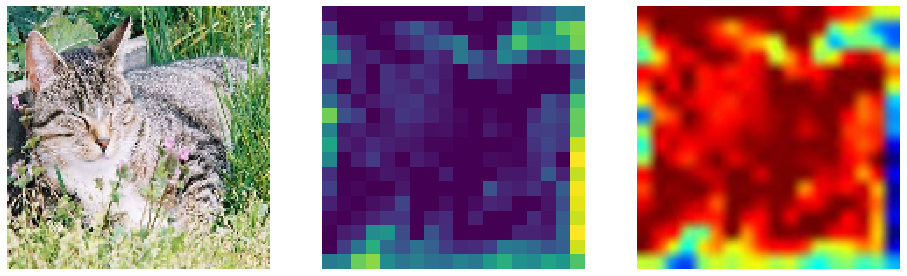

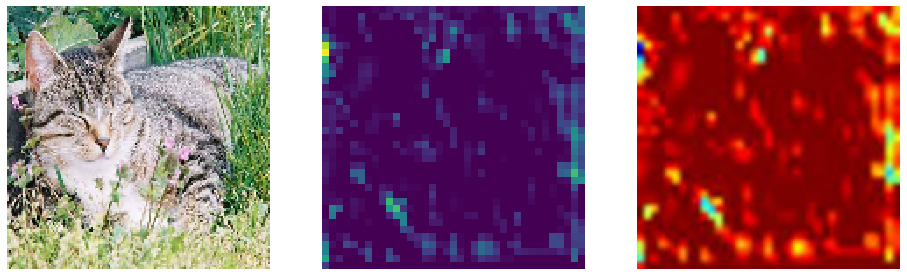

 
 Model1 says this is a  --> Cat, Model 2 says ---> Dog and it is actually a ---> Dog


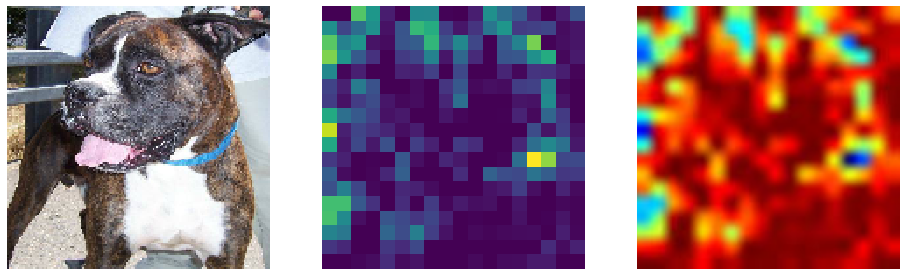

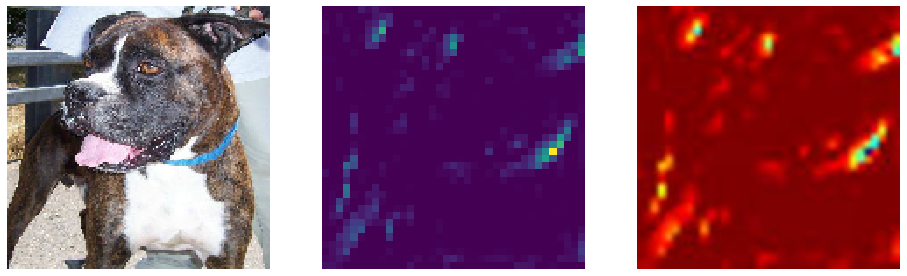

 
 Model1 says this is a  --> Dog, Model 2 says ---> Dog and it is actually a ---> Cat


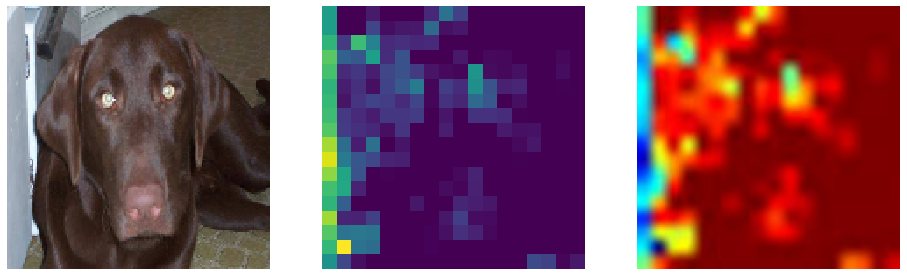

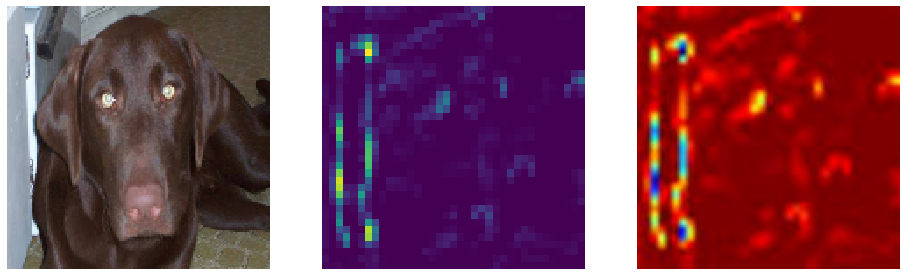

 
 Model1 says this is a  --> Dog, Model 2 says ---> Cat and it is actually a ---> Cat


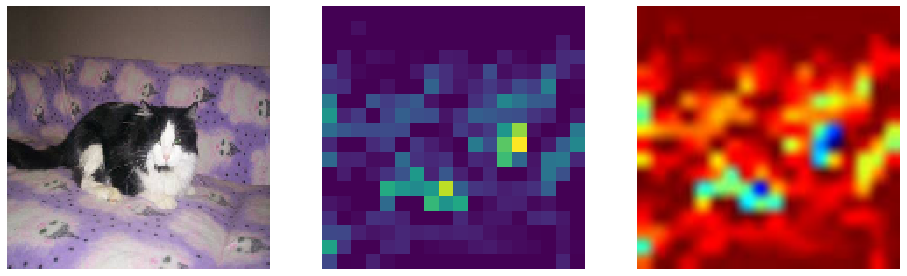

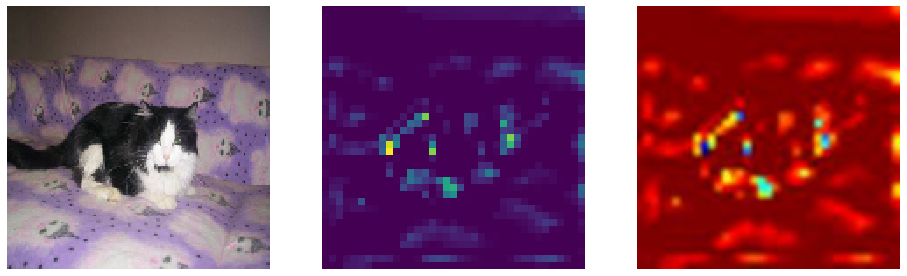

 
 Model1 says this is a  --> Cat, Model 2 says ---> Cat and it is actually a ---> Cat


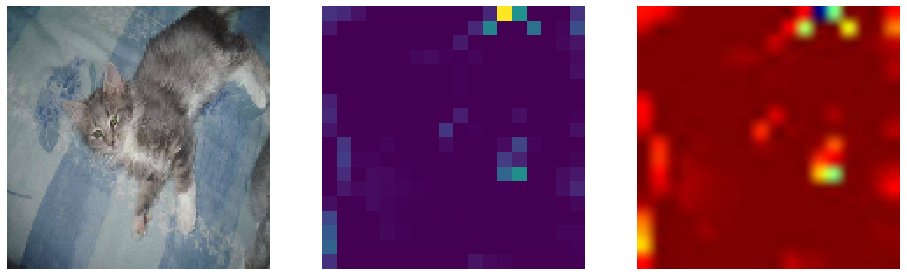

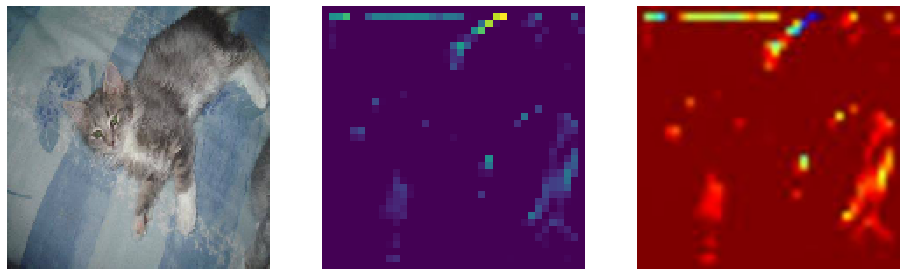

In [69]:
from time import sleep

m1, layer_name1 = model_new, 'conv2d_7'
m2, layer_name2 = model_new2, 'conv2d_31'
# plt.figure(figsize=(15,10))

for index, img in enumerate(sample_val_images):
    print(f" Model1 says this is a  --> {dic[m1.predict_classes(img.reshape((1, 150, 150, 3)))[0][0]]}, Model 2 says ---> {dic[m2.predict_classes(img.reshape((1, 150, 150, 3)))[0][0]]} and it is actually a ---> {dic[int(val_labels[index])]}")
    heatmap1 = make_gradcam_heatmap(img.reshape(1, 150, 150, 3), m1, layer_name1)
    heatmap2 = make_gradcam_heatmap(img.reshape(1, 150, 150, 3), m2, layer_name2)
    fig, axes = plt.subplots(ncols=3, figsize=(16, 12))
    ax1, ax2, ax3 = axes
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    im1 = ax1.matshow(img)
    im2 = ax2.imshow(heatmap1)
    im3 = save_and_display_gradcam_own_model(img, heatmap1)
    plt.show()
    fig, axes = plt.subplots(ncols=3, figsize=(16, 12))
    ax1, ax2, ax3 = axes
    ax1.axis('off')
    ax2.axis('off')
    # ax3.set_title('ax2 title')
    ax3.axis('off')
    im1 = ax1.matshow(img)
    im2 = ax2.imshow(heatmap2)
    im3 = save_and_display_gradcam_own_model(img, heatmap2)
    plt.show()
    print(" ")

GRAD CAMS 2. DIFFERENCES BETWEEN LAYERS ON THE SAME MODEL

Now, let us check the differences between different layers.
We will compare the first conv layer vs the last one. We should expect similar 
results than in the previous experiment.

 What First Conv Layer Observes: 


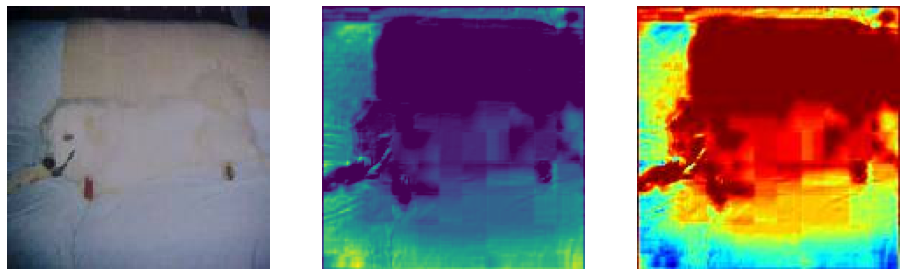

 What Last Conv Layer Observes: 


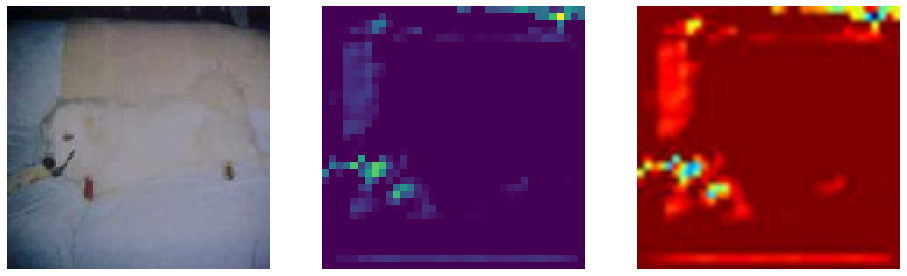

 
 What First Conv Layer Observes: 


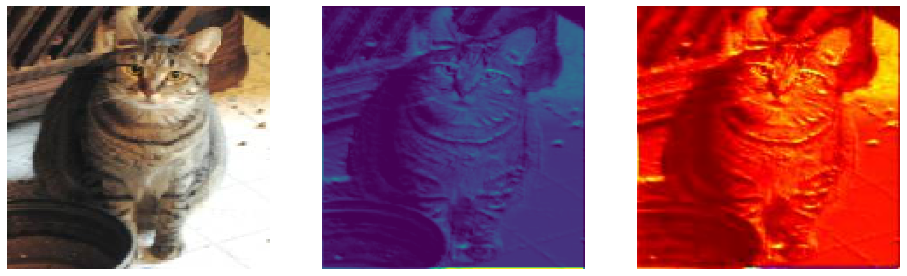

 What Last Conv Layer Observes: 


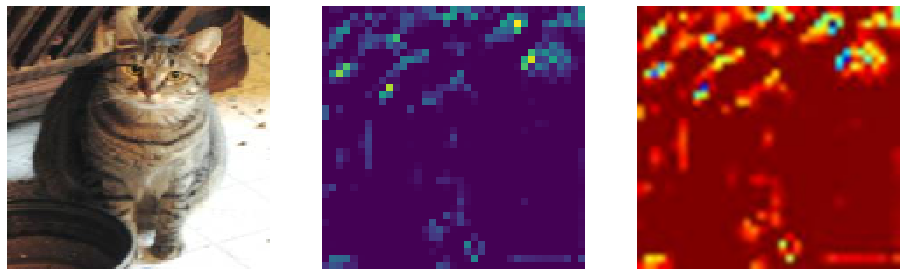

 
 What First Conv Layer Observes: 


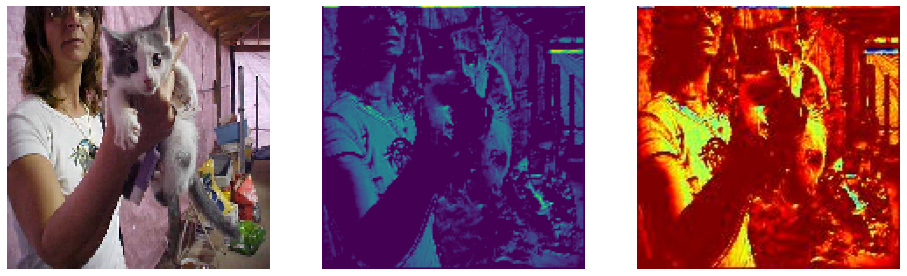

 What Last Conv Layer Observes: 


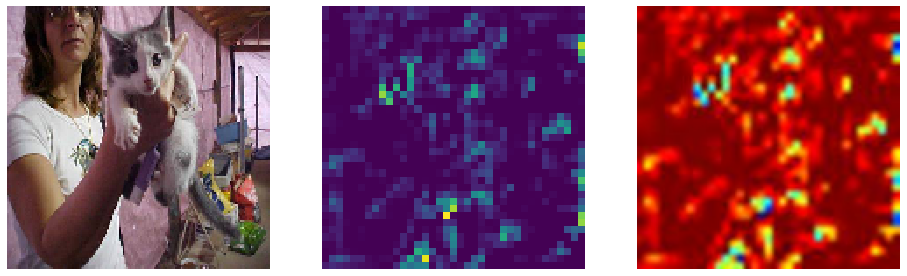

 
 What First Conv Layer Observes: 


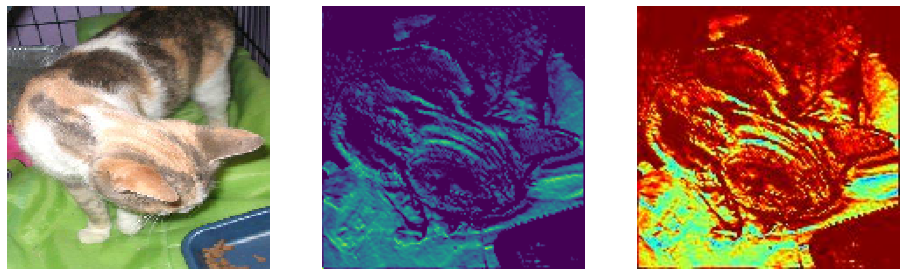

 What Last Conv Layer Observes: 


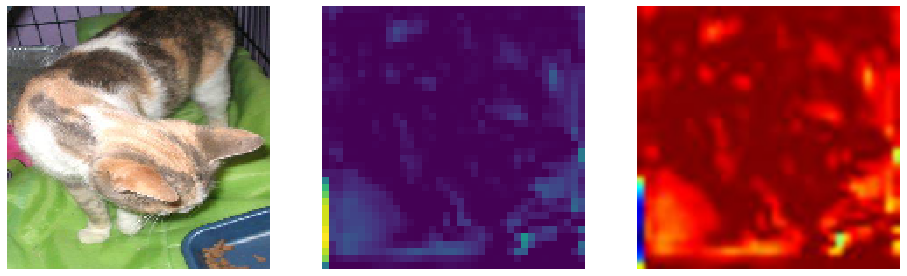

 
 What First Conv Layer Observes: 


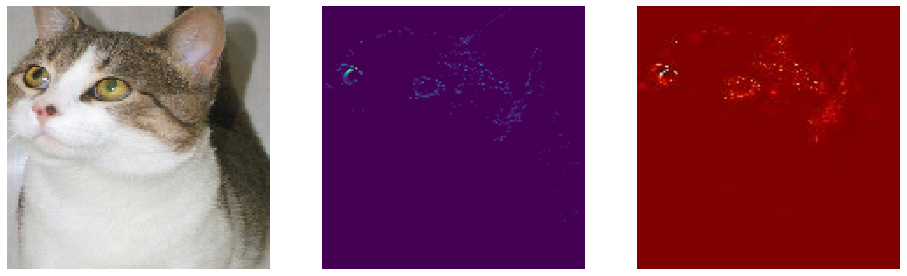

 What Last Conv Layer Observes: 


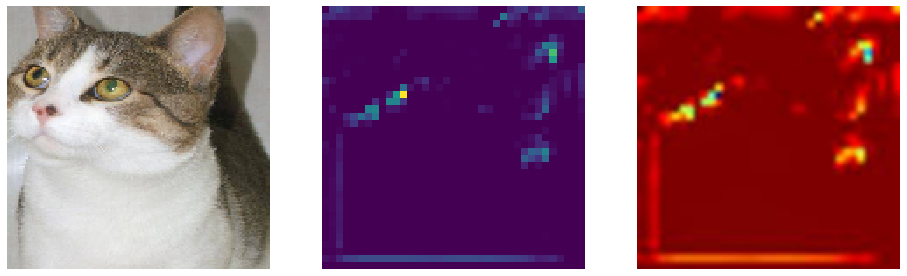

 
 What First Conv Layer Observes: 


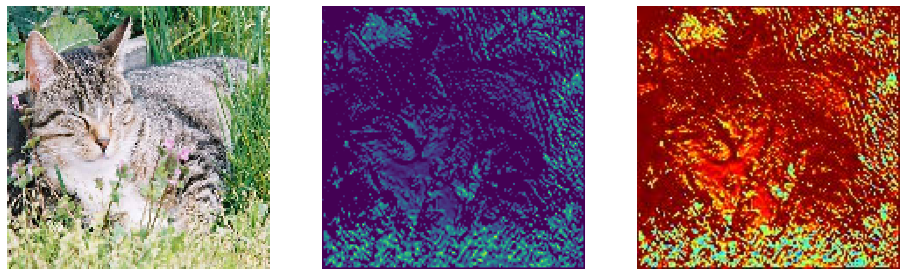

 What Last Conv Layer Observes: 


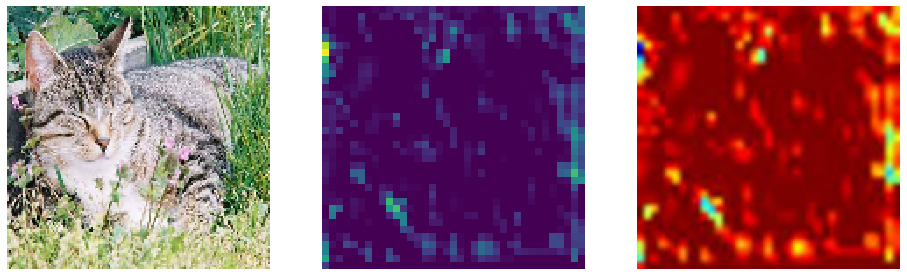

 
 What First Conv Layer Observes: 


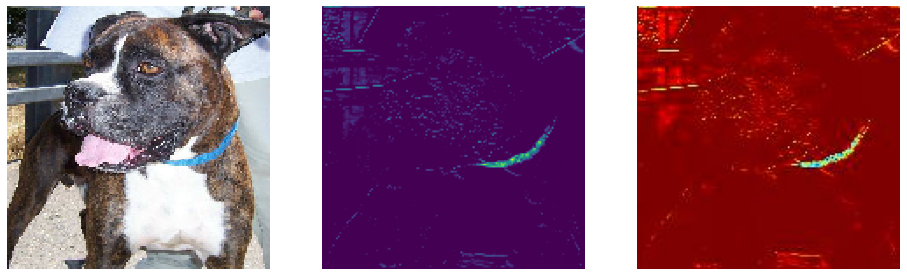

 What Last Conv Layer Observes: 


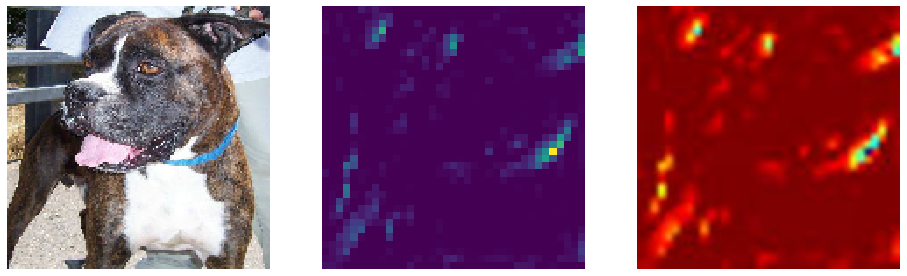

 
 What First Conv Layer Observes: 


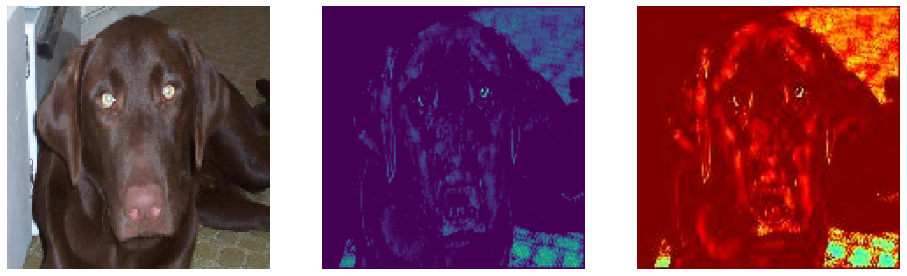

 What Last Conv Layer Observes: 


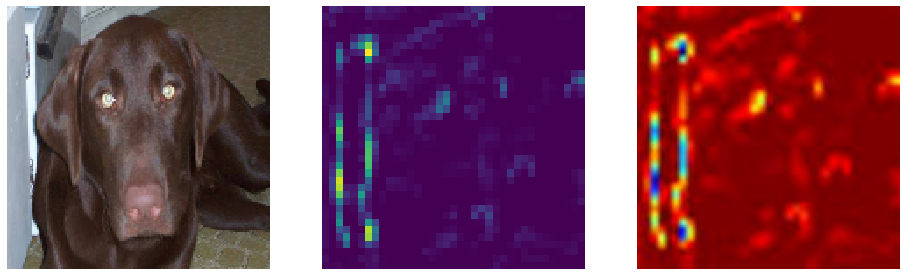

 
 What First Conv Layer Observes: 


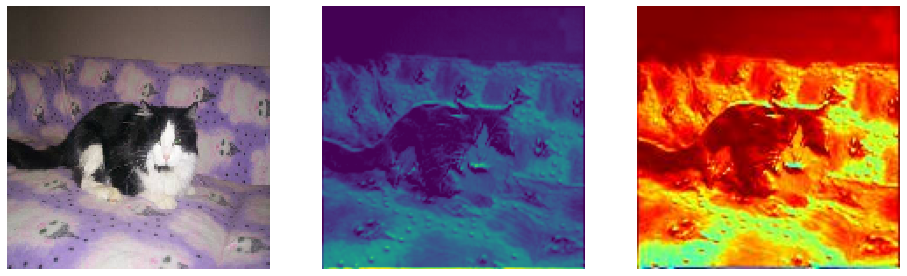

 What Last Conv Layer Observes: 


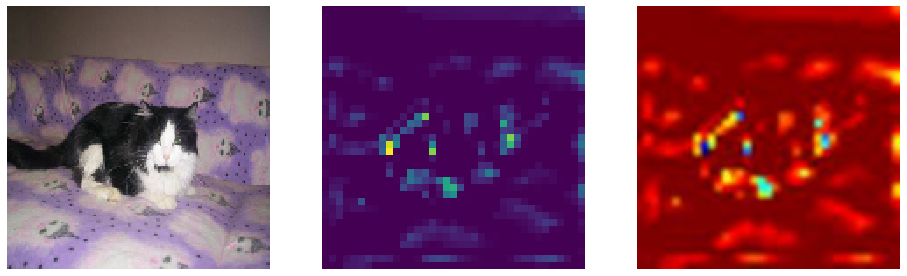

 
 What First Conv Layer Observes: 


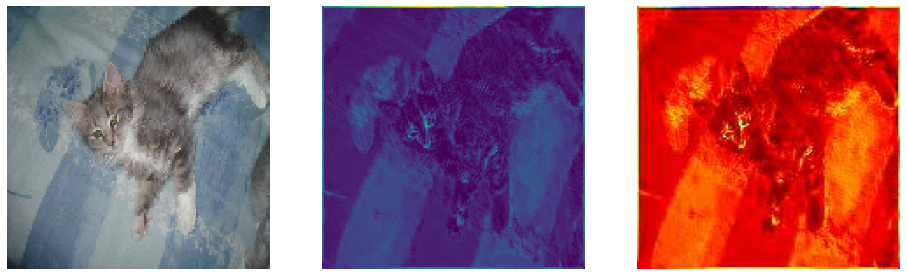

 What Last Conv Layer Observes: 


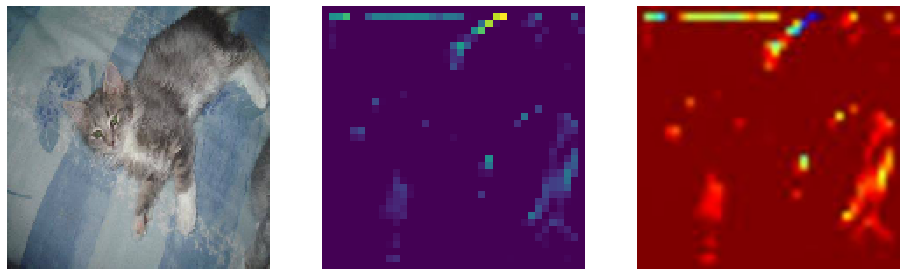

In [72]:
from time import sleep

m1, layer_name1 = model_new2, 'conv2d_26'
m2, layer_name2 = model_new2, 'conv2d_31'
# plt.figure(figsize=(15,10))

for index, img in enumerate(sample_val_images):
    print(" What First Conv Layer Observes: ")
    heatmap1 = make_gradcam_heatmap(img.reshape(1, 150, 150, 3), m1, layer_name1)
    heatmap2 = make_gradcam_heatmap(img.reshape(1, 150, 150, 3), m2, layer_name2)
    fig, axes = plt.subplots(ncols=3, figsize=(16, 12))
    ax1, ax2, ax3 = axes
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    im1 = ax1.matshow(img)
    im2 = ax2.imshow(heatmap1)
    im3 = save_and_display_gradcam_own_model(img, heatmap1)
    plt.show()
    print(" What Last Conv Layer Observes: ")
    fig, axes = plt.subplots(ncols=3, figsize=(16, 12))
    ax1, ax2, ax3 = axes
    ax1.axis('off')
    ax2.axis('off')
    # ax3.set_title('ax2 title')
    ax3.axis('off')
    im1 = ax1.matshow(img)
    im2 = ax2.imshow(heatmap2)
    im3 = save_and_display_gradcam_own_model(img, heatmap2)
    plt.show()
    print(" ")

Now, we will study the Effects of changing the size of the image. From a naive perspective, It Should improve the results since the resolution is also improved and then apply grad cams to check it.

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 299, 299, 32)      896       
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 299, 299, 32)      9248      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 149, 149, 32)      0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 149, 149, 32)      0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 149, 149, 64)      18496     
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 149, 149, 64)      36928     
____________________________________

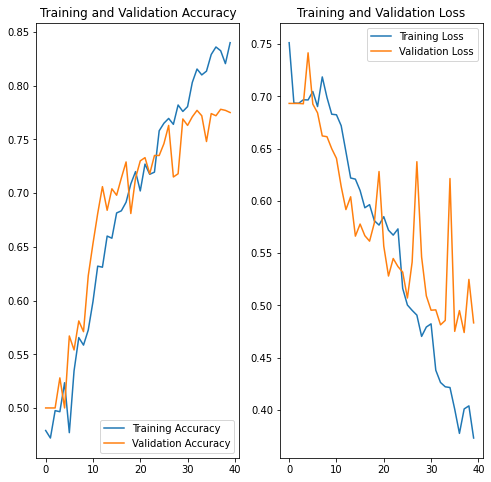

In [39]:
batch_size = 10
epochs = 15
IMG_HEIGHT = 299
IMG_WIDTH = 299

# Generator for our training data
train_image_generator = ImageDataGenerator(rescale=1./255, rotation_range=20, vertical_flip=True)
# Generator for our validation data
validation_image_generator = ImageDataGenerator(rescale=1./255)


train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size, directory=train_dir, 
                                                           shuffle=True, target_size=(IMG_HEIGHT, IMG_WIDTH), class_mode='binary')

val_data_gen = validation_image_generator.flow_from_directory(batch_size=batch_size,directory=validation_dir,target_size=(IMG_HEIGHT, IMG_WIDTH),class_mode='binary')

model_new3 = Sequential([Conv2D(32, 3, padding='same', activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH ,3)),
                        Conv2D(32, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Dropout(0.15),
                        Conv2D(64, 3, padding='same', activation='relu'),
                        Conv2D(64, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Dropout(0.15),
                        Conv2D(128, 3, padding='same', activation='relu'),
                        Conv2D(128, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Dropout(0.25),
                        Flatten(),
                        Dense(128, activation='relu'),
                        Dropout(0.5),
                        Dense(32, activation='relu'),
                        Dense(1, activation = 'sigmoid')])

from keras.callbacks import EarlyStopping, ReduceLROnPlateau

# To prevent over fitting we will stop the learning after 10 epochs and val_loss value not decreased
earlystop = EarlyStopping(patience=10)



# We will reduce the learning rate when then accuracy not increase for 2 steps

learning_rate_reduction = ReduceLROnPlateau(monitor='accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

callbacks = [learning_rate_reduction]


rms = tf.keras.optimizers.RMSprop(lr=0.00075)
model_new3.compile(optimizer=rms, loss='binary_crossentropy',metrics=['accuracy'])
model_new3.summary()
batch_size = 10
epochs = 40



history = model_new3.fit(train_data_gen, steps_per_epoch=int(total_train/batch_size), 
                                epochs=epochs, validation_data=val_data_gen, validation_steps=int(total_val/batch_size), callbacks=callbacks)


acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']
epochs_range = range(epochs)
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [73]:
# for layer in model_new3.layers:
#   print(layer.name)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


Predicted: [[0]]


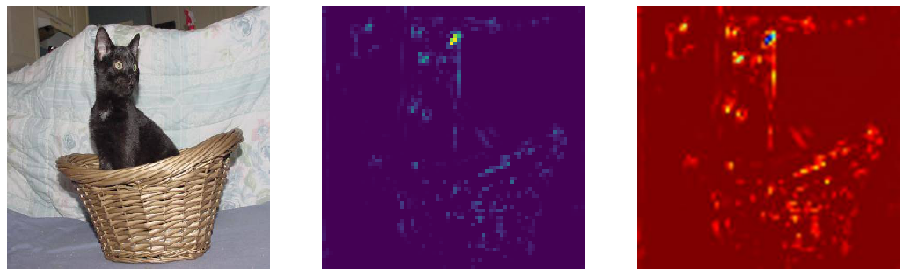

 
Predicted: [[0]]


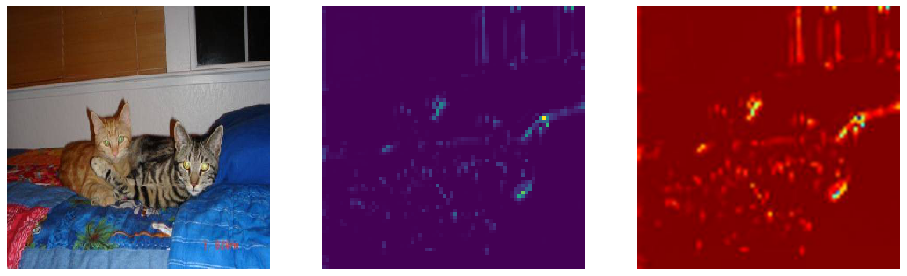

 
Predicted: [[0]]


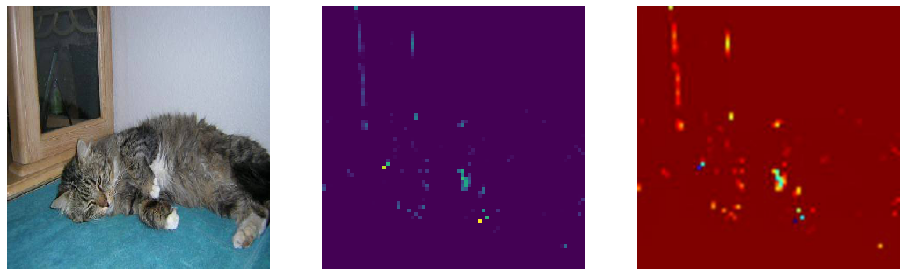

 
Predicted: [[0]]


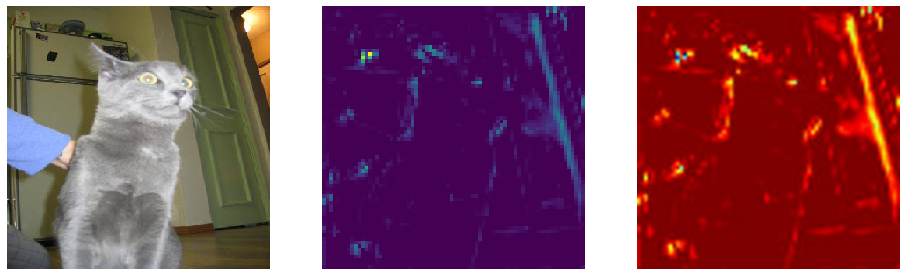

 
Predicted: [[0]]


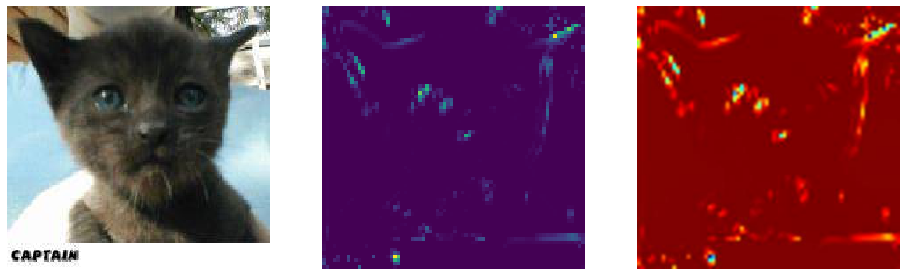

 
Predicted: [[0]]


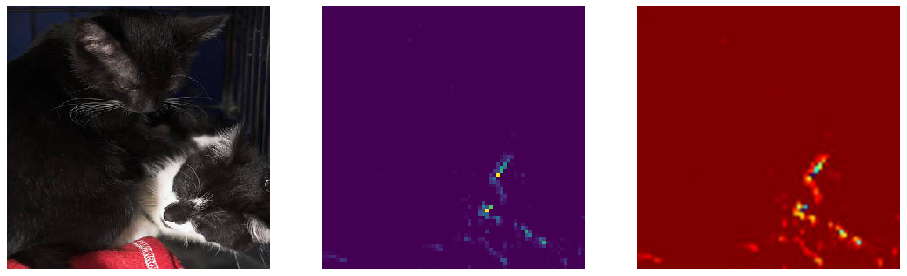

 
Predicted: [[1]]


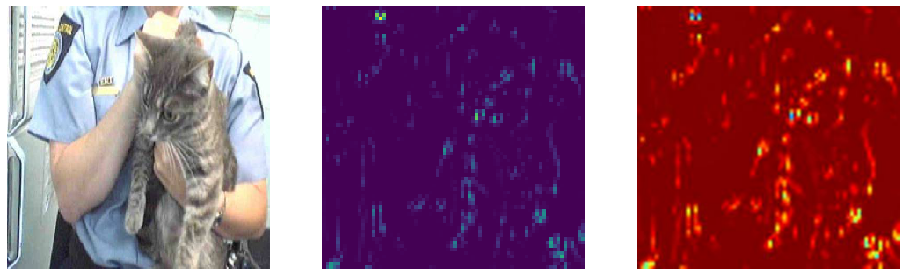

 
Predicted: [[0]]


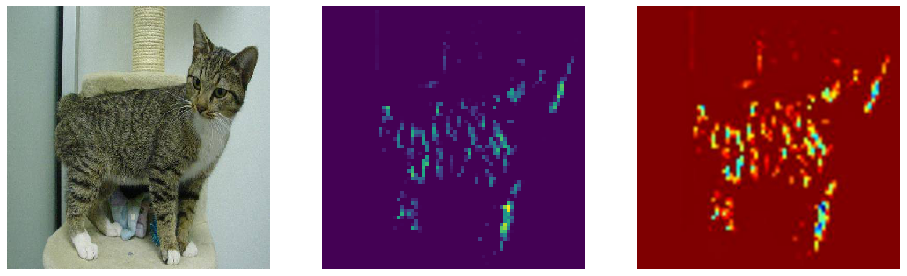

 
Predicted: [[0]]


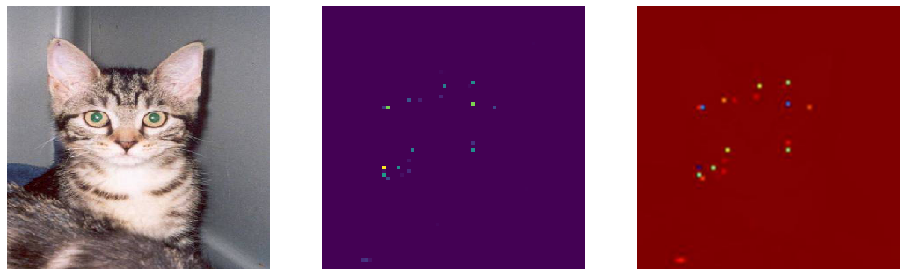

 
Predicted: [[0]]


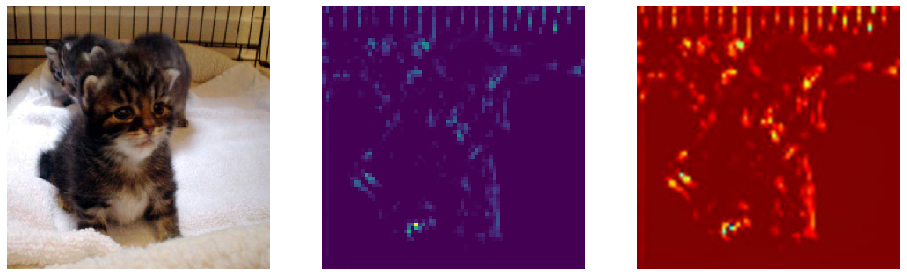

In [47]:
imgs, _ = next(val_data_gen)

for image in imgs[:10]:
  preds = model_new3.predict_classes(image.reshape((1, 299, 299, 3)))
  print("Predicted:", preds)
  heatmap1 = make_gradcam_heatmap(image.reshape((1, 299, 299, 3)), model_new3, 'conv2d_25')
  fig, axes = plt.subplots(ncols=3, figsize=(16, 12))
  ax1, ax2, ax3 = axes
  ax1.axis('off')
  ax2.axis('off')
  ax3.axis('off')
  im1 = ax1.matshow(image)
  im2 = ax2.imshow(heatmap1)
  im3 = save_and_display_gradcam_own_model(image, heatmap1)
  plt.show()
  print(" ")

GRAD CAMS 3. EFFECTS ON PRETRAINED MODEL

Now that we have reshapped the data generator, let us check what pretrained model sees.

In [50]:
# for layer in model.layers:
#   print(layer.name)

Predicted: Chihuahua
 What First Conv Layer Observes: 


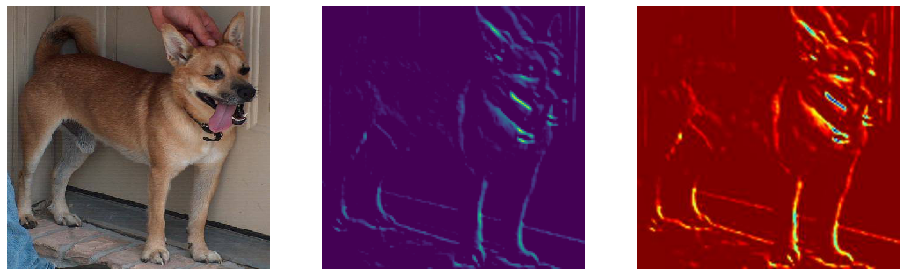

 What Last Conv Layer Observes: 


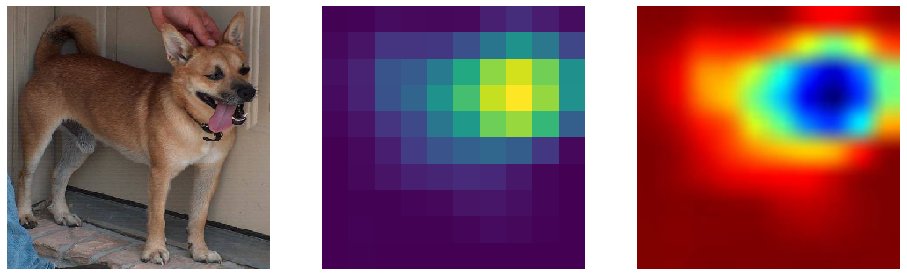

 
Predicted: golden_retriever
 What First Conv Layer Observes: 


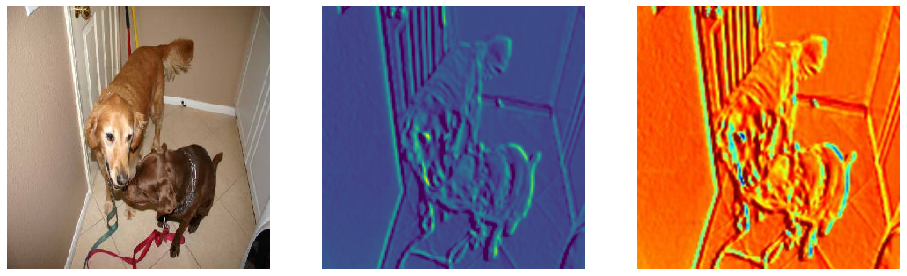

 What Last Conv Layer Observes: 


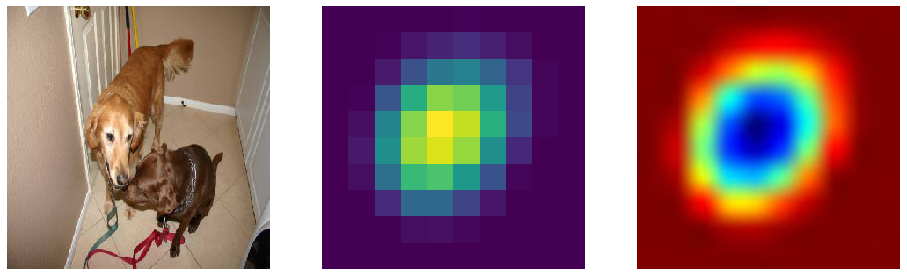

 
Predicted: Siamese_cat
 What First Conv Layer Observes: 


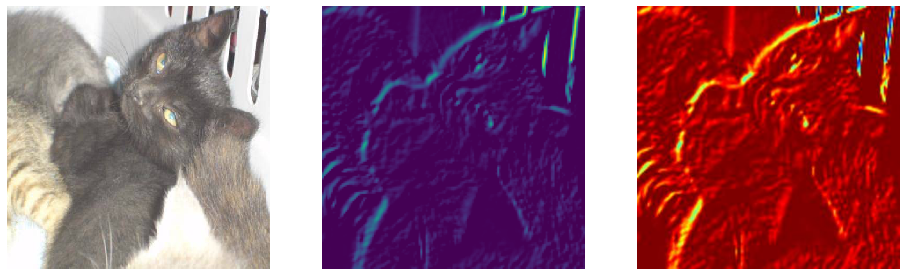

 What Last Conv Layer Observes: 


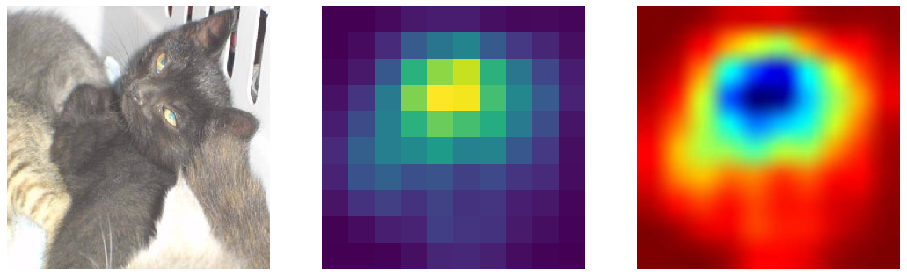

 
Predicted: Lhasa
 What First Conv Layer Observes: 


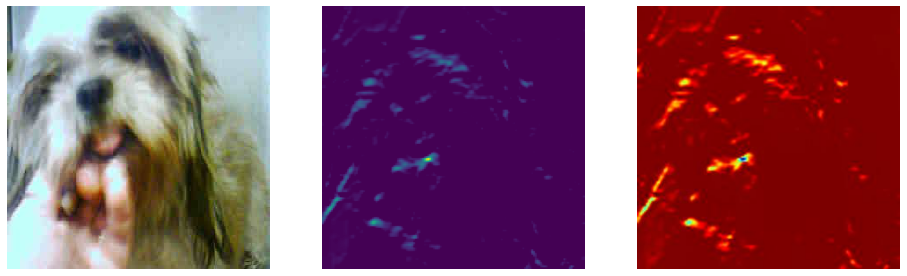

 What Last Conv Layer Observes: 


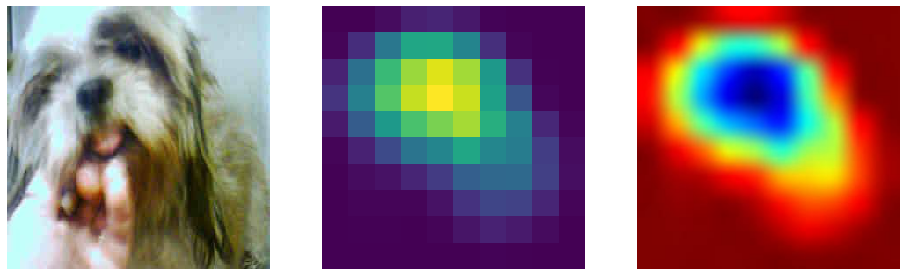

 
Predicted: tabby
 What First Conv Layer Observes: 


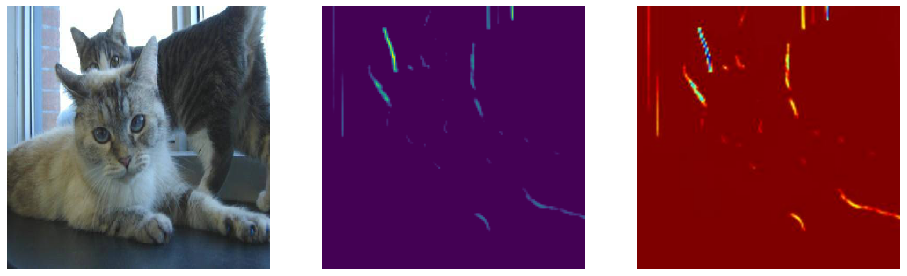

 What Last Conv Layer Observes: 


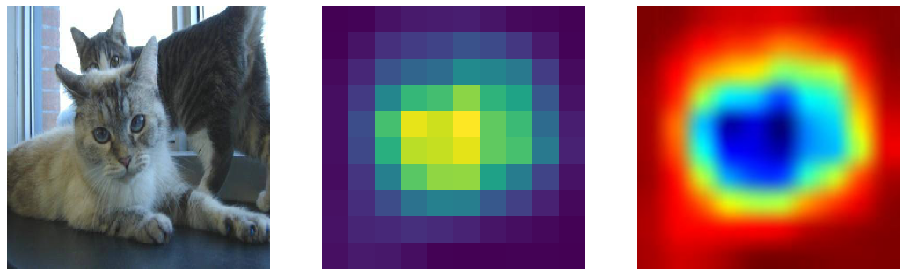

 
Predicted: tabby
 What First Conv Layer Observes: 


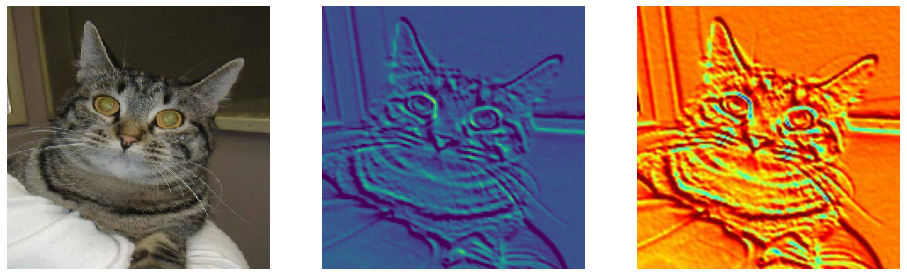

 What Last Conv Layer Observes: 


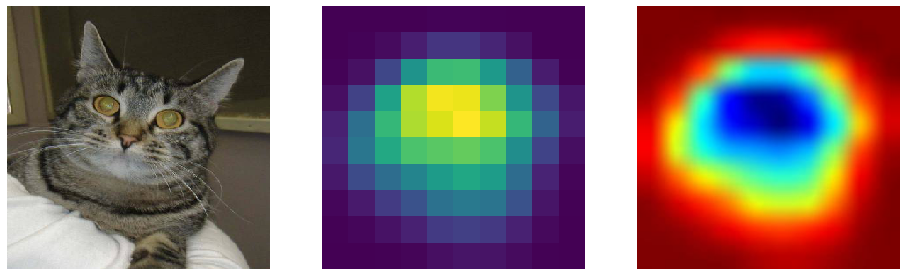

 
Predicted: Norwegian_elkhound
 What First Conv Layer Observes: 


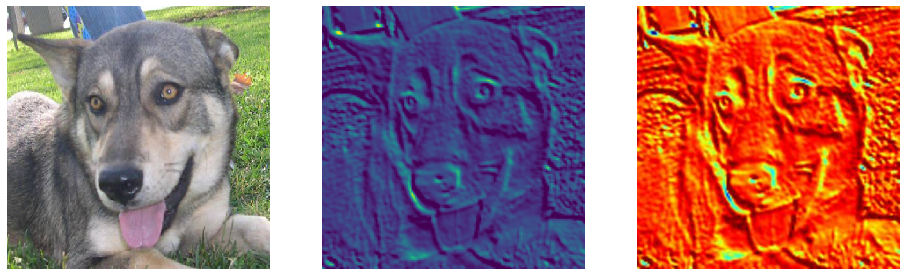

 What Last Conv Layer Observes: 


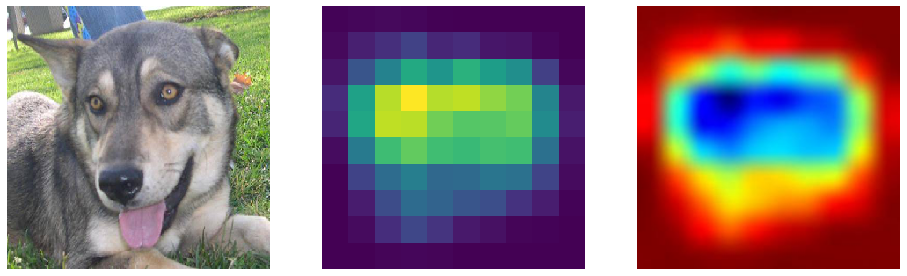

 
Predicted: German_short-haired_pointer
 What First Conv Layer Observes: 


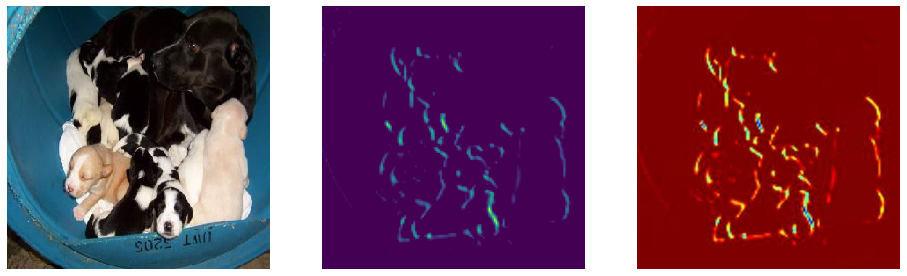

 What Last Conv Layer Observes: 


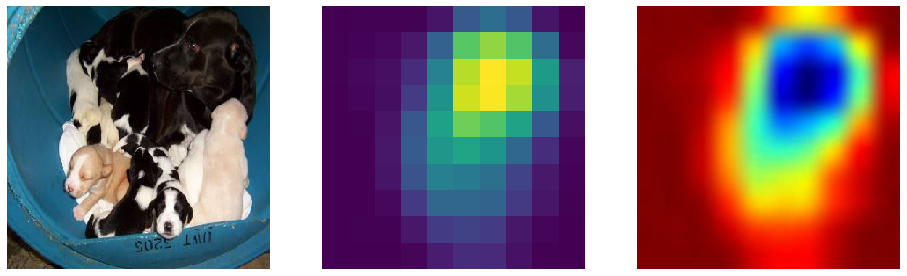

 
Predicted: Labrador_retriever
 What First Conv Layer Observes: 


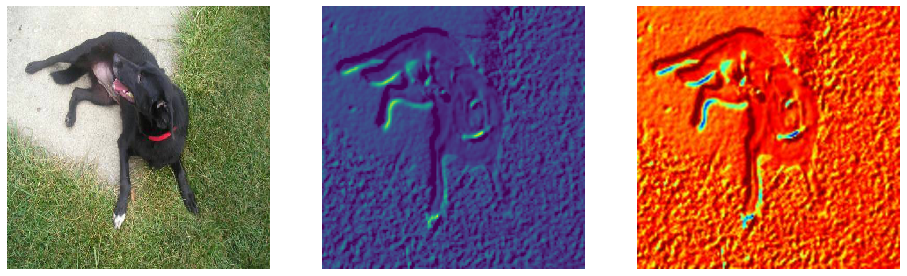

 What Last Conv Layer Observes: 


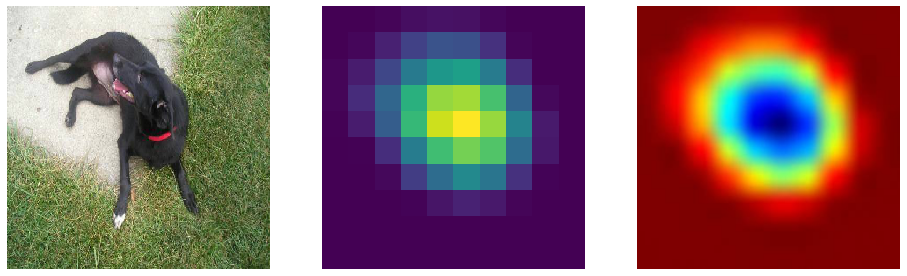

 
Predicted: Egyptian_cat
 What First Conv Layer Observes: 


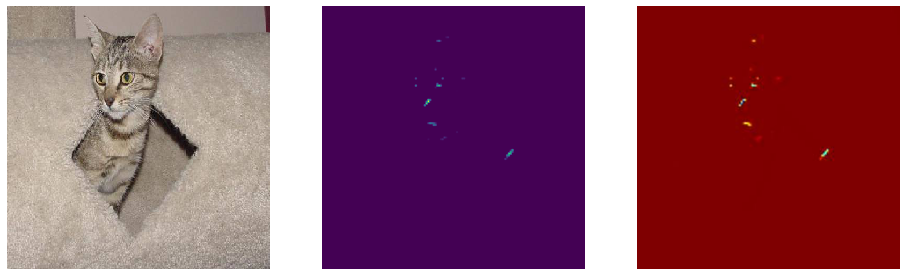

 What Last Conv Layer Observes: 


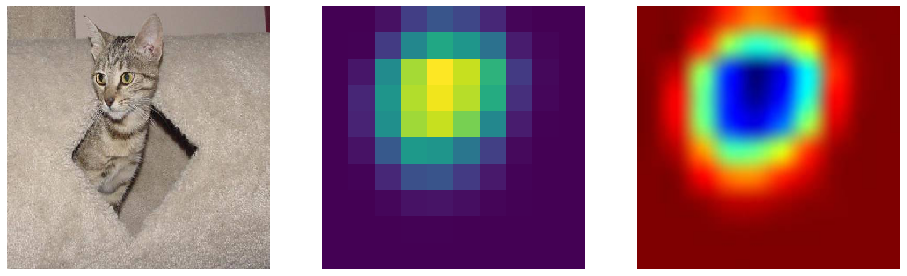

In [53]:
from time import sleep

m1, layer_name1 = model, 'block1_conv2'
m2, layer_name2 = model, 'block14_sepconv2_act'
# plt.figure(figsize=(15,10))

imgs, _ = next(val_data_gen)

for image in imgs[:10]:
    preds = model.predict(image.reshape((1, 299, 299, 3)))
    print("Predicted:", decode_predictions(preds, top=1)[0][0][1])
    print(" What First Conv Layer Observes: ")
    heatmap1 = make_gradcam_heatmap(image.reshape((1, 299, 299, 3)), m1, layer_name1)
    heatmap2 = make_gradcam_heatmap(image.reshape((1, 299, 299, 3)), m2, layer_name2)
    fig, axes = plt.subplots(ncols=3, figsize=(16, 12))
    ax1, ax2, ax3 = axes
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    im1 = ax1.matshow(image)
    im2 = ax2.imshow(heatmap1)
    im3 = save_and_display_gradcam_own_model(image, heatmap1)
    plt.show()
    print(" What Last Conv Layer Observes: ")
    fig, axes = plt.subplots(ncols=3, figsize=(16, 12))
    ax1, ax2, ax3 = axes
    ax1.axis('off')
    ax2.axis('off')
    # ax3.set_title('ax2 title')
    ax3.axis('off')
    im1 = ax1.matshow(image)
    im2 = ax2.imshow(heatmap2)
    im3 = save_and_display_gradcam_own_model(image, heatmap2)
    plt.show()
    print(" ")